In [ ]:
# %% {Imports}
from qualibrate.core import QualibrationNode, NodeParameters
from quam_config import Quam

description = """
        CLOSE ALL OTHER QMs.
"""



# Instantiate the QUAM class from the state file
machine = Quam.load()


# %% {Close_all_quantum_machines}


qmm = machine.connect()
qmm.close_all_qms()


2026-05-15 19:55:18,847 - qm - INFO     - Starting session: b213423e-6c93-4d92-a1c6-4adb9598e221


c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:639: UserWarning: No QuamRoot initialized, cannot retrieve absolute reference #/wiring/readout/s1/rf/opx_output from ReadoutResonatorSingle
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:639: UserWarning: No QuamRoot initialized, cannot retrieve absolute reference #/wiring/readout/s2/rf/opx_output from ReadoutResonatorSingle
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:639: UserWarning: No QuamRoot initialized, cannot retrieve absolute reference #/physical_channels from QuamDict
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:639: UserWarning: No QuamRoot initialized, cannot retrieve absolute reference #/physical_channels/plunger_1 from QuamDict
  warnings.warn(
c:\Users\siqec.project\.conda\envs

2026-05-15 19:55:29,056 - qm - INFO     - Performing health check
2026-05-15 19:55:29,063 - qm - INFO     - Cluster healthcheck completed successfully.


In [2]:
machine.save()

In [4]:
print(type(machine.wiring))          # probably just dict
print("wiring" in machine.to_dict()) # probably False


<class 'quam.core.quam_classes.QuamDict'>
True


In [6]:
machine.set_pulse_family("hermite")

In [9]:
import numpy as np
q1, q2 = machine.qubits["q1"], machine.qubits["q2"]
delta_f = abs(q1.larmor_frequency - q2.larmor_frequency)
beta = 0.1102 * (60-8.7)
T = np.sqrt(1+(beta/np.pi)**2)/delta_f
print(int(2*T*1e9)//4 * 4)

856


In [10]:
machine.quantum_dot_pairs["virtual_dot_2_virtual_dot_3_pair"].barrier_gate

BarrierGate(id='virtual_barrier_2', macros={'align': AlignMacro(id='align', fidelity=None, duration=0.0), 'wait': WaitMacro(id='wait', fidelity=None, duration=16, elements=None)}, physical_channel=VoltageGate(operations={'half_max_square': SquarePulse(length=16, id=None, digital_marker=None, amplitude=0.25, axis_angle=None)}, id='barrier_2', digital_outputs={}, sticky=StickyChannelAddon(duration=16, enabled=True, analog=True, digital=False), intermediate_frequency=None, thread=None, core=None, opx_output=LFFEMAnalogOutputPort(controller_id='con1', fem_id=7, port_id=6, offset=None, delay=161, crosstalk=None, feedforward_filter=None, feedback_filter=None, shareable=False, sampling_rate=1000000000.0, upsampling_mode='pulse', exponential_filter=[(1.0, 7607773.666802497)], exponential_dc_gain=None, high_pass_filter=None, output_mode='amplified'), filter_fir_taps=None, filter_iir_taps=None, opx_output_offset=None, attenuation=0.0, settling_time=None, current_external_voltage=None, dac_spec=N

In [ ]:
import h5py


In [ ]:
# %% {Imports}
import logging
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
from dataclasses import asdict

logger = logging.getLogger(__name__)

from qm.qua import *

from qualang_tools.loops import from_array
from qualang_tools.multi_user import qm_session
from calibration_utils.common_utils.experiment import progress_counter_with_log
from qualang_tools.units import unit

from qualibrate.core import QualibrationNode
from quam_config import QubitQuam as Quam
from calibration_utils.common_utils.experiment import get_qubits
from calibration_utils.common_utils.parity_streams import (
    declare_parity_streams,
    save_parity_measurement,
    buffer_parity_streams,
    process_parity_streams,
)
from calibration_utils.common_utils.annotation import annotate_node_figures
from calibration_utils.qubit_spectroscopy_parity_diff import (
    Parameters,
    fit_raw_data,
    log_fitted_results,
    plot_raw_data_with_fit,
)
from qualibration_libs.runtime import simulate_and_plot
from qualibration_libs.data import XarrayDataFetcher

# %% {Node initialisation}
description = """
        QUBIT SPECTROSCOPY PARITY DIFFERENCE
This sequence involves parking the qubit at the manipulation bias point, and playing pulses of varying frequency
to drive the qubit. When the pulse frequency is the Larmor frequency, the qubit is driven, and the parity is measured
via PSB.

Prerequisites:
    - Having calibrated the relevant voltage points.
    - Having calibrated the PSB readout scheme.


State update:
    - The qubit frequency (and optionally the corresponding LO/IF plan) for the specified qubit operation.
"""

# Be sure to include [Parameters, Quam] so the node has proper type hinting
node = QualibrationNode[Parameters, Quam](
    name="08b_qubit_spectroscopy",  # Name should be unique
    description=description,  # Describe what the node is doing, which is also reflected in the QUAlibrate GUI
    parameters=Parameters(),  # Node parameters defined under quam_experiment/experiments/node_name
)


# Any parameters that should change for debugging purposes only should go in here
# These parameters are ignored when run through the GUI or as part of a graph
@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    """Allow the user to locally set the node parameters for debugging purposes, or execution in the Python IDE."""
    # You can get type hinting in your IDE by typing node.parameters.
    # node.parameters.qubits = ["Q1", "Q2", "Q3", "Q4"]
    # node.parameters.simulate = True
    pass


# Instantiate the QUAM class from the state file
node.machine = Quam.load()


# %% {Create_QUA_program}
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Create the sweep axes and generate the QUA program from the pulse sequence and the node parameters."""
    # Get the active qubits from the node and organize them by batches
    node.namespace["qubits"] = qubits = get_qubits(node)
    num_qubits = len(qubits)

    # Adjust the pulse duration and amplitude to drive the qubit into a mixed state - can be None
    operation_len = node.parameters.operation_len_in_ns

    # Pulse amplitude sweep (as a pre-factor of the qubit pulse amplitude) - must be within [-2; 2)
    operation_amp_factor = node.parameters.operation_amplitude_factor

    for qubit in qubits:
        qubit.x.update(
            amplitude_scale=operation_amp_factor,
            duration=operation_len,
        )

    u = unit(coerce_to_integer=True)
    n_avg = node.parameters.num_shots  # The number of averages

    # Qubit detuning sweep with respect to their resonance frequencies
    span = node.parameters.frequency_span_in_mhz * u.MHz
    step = node.parameters.frequency_step_in_mhz * u.MHz
    dfs = np.arange(-span // 2, +span // 2, step)

    # Register the sweep axes to be added to the dataset when fetching data
    node.namespace["sweep_axes"] = {
        "qubit": xr.DataArray(qubits.get_names()),
        "detuning": xr.DataArray(
            dfs, attrs={"long_name": "drive frequency", "units": "Hz"}
        ),
    }

    with program() as node.namespace["qua_program"]:
        df = declare(int)
        n = declare(int)

        p2, p1, parity_streams = declare_parity_streams(node, qubits)

        i_st = {qubit.name: declare_output_stream() for qubit in qubits}
        q_st = {qubit.name: declare_output_stream() for qubit in qubits}

        n_st = declare_output_stream()

        for qubit in qubits:
            intermediate_frequency = qubit.xy.intermediate_frequency
            qd_pair = node.machine.quantum_dot_pairs[node.machine.find_quantum_dot_pair(qubit.quantum_dot.name, qubit.preferred_readout_quantum_dot)]
            qubit_pair = [qp for qp_name, qp in node.machine.qubit_pairs.items() if qp.quantum_dot_pair == qd_pair][0]
            with for_(n, 0, n < n_avg, n + 1):
                save(n, n_st)
                with for_(*from_array(df, dfs)):
                    qubit.xy.update_frequency(intermediate_frequency + df)

                    align()

                    if node.parameters.parity_pre_measurement:
                        qubit.empty()
                        a1 = qubit.measure()
                    
                    qubit.empty()
                    wait(2000)

                    align()
                    qubit.x180()
                    align()

                    (i, q, a2) = qubit.measure(return_iq=True)

                    qubit.voltage_sequence.apply_compensation_pulse(return_to_zero = True, go_to_zero=True)

                    align()

                    if node.parameters.parity_pre_measurement:
                        assign(p1, Cast.to_int(a1))

                    assign(p2, Cast.to_int(a2))

                    save_parity_measurement(node, qubit.name, p1, p2, parity_streams)
                    save(i, i_st[qubit.name])
                    save(q, q_st[qubit.name])

            qubit.xy.update_frequency(intermediate_frequency)

        with stream_processing():
            n_st.save("n")
            n_dfs = len(dfs)
            for qubit in qubits:
                buffer_parity_streams(node, qubit.name, parity_streams, n_dfs)
                i_st[qubit.name].buffer(n_dfs).average().save(f"I_{qubit.name}")
                q_st[qubit.name].buffer(n_dfs).average().save(f"Q_{qubit.name}")

# %% {Simulate}
@node.run_action(
    skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate
)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program"""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Simulate the QUA program, generate the waveform report and plot the simulated samples
    samples, fig, wf_report = simulate_and_plot(
        qmm, config, node.namespace["qua_program"], node.parameters
    )
    # Store the figure, waveform report and simulated samples
    node.results["simulation"] = {
        "figure": fig,
        "wf_report": wf_report,
        "samples": samples,
    }


# %% {Execute}
@node.run_action(
    skip_if=node.parameters.load_data_id is not None or node.parameters.simulate
)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP, execute the QUA program and fetch the raw data and store it in a xarray dataset called "ds_raw"."""
    # Connect to the QOP
    qmm = node.machine.connect()
    # Get the config from the machine
    config = node.machine.generate_config()
    # Execute the QUA program only if the quantum machine is available (this is to avoid interrupting running jobs).
    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        # The job is stored in the node namespace to be reused in the fetching_data run_action
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        # Display the progress bar
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter_with_log(
                data_fetcher.get("n", 0),
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
                node=node
            )
        # Display the execution report to expose possible runtime errors
        node.log(job.execution_report())
    # Register the raw dataset
    node.results["ds_raw"] = dataset


# %% {Load_historical_data}
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    # Load the specified dataset
    node.load_from_id(node.parameters.load_data_id)
    node.parameters.load_data_id = load_data_id
    # Get the active qubits from the loaded node parameters
    node.namespace["qubits"] = get_qubits(node)


# %% {Process_raw_data}
@node.run_action(skip_if=node.parameters.simulate)
def process_raw_data(node: QualibrationNode[Parameters, Quam]):
    """Compute conditional expectations from joint-outcome parity streams."""
    node.results["ds_raw"] = process_parity_streams(
        node.results["ds_raw"],
        [q.name for q in node.namespace["qubits"]],
        parity_pre_measurement=node.parameters.parity_pre_measurement,
        sweep_dims=("detuning",),
    )


# %% {Analyse_data}
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """Analyse the raw data and store the fitted data in another xarray dataset "ds_fit" and the fitted results in the "fit_results" dictionary."""
    node.results["ds_fit"], fit_results = fit_raw_data(node.results["ds_raw"], node)
    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}

    # Log the relevant information extracted from the data analysis
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qubit_name: ("successful" if fit_result["success"] else "failed")
        for qubit_name, fit_result in node.results["fit_results"].items()
    }


# %% {Plot_data}
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """Plot the raw and fitted data in specific figures whose shape is given by qubit.grid_location."""
    qubits = node.namespace["qubits"]
    ds_raw = node.results["ds_raw"]

    fig_raw_fit = plot_raw_data_with_fit(
        ds_raw,
        qubits,
        node.results["ds_fit"],
        analysis_signal=node.parameters.analysis_signal,
    )

    # IQ vs frequency — one subplot per qubit, I and Q as separate lines
    qubit_names = [q.name for q in qubits]
    n = len(qubit_names)
    fig_iq, axes = plt.subplots(1, n, figsize=(7 * n, 5), squeeze=False)
    for idx, qname in enumerate(qubit_names):
        ax = axes[0, idx]
        i_key = f"I_{qname.rstrip('0123456789')}"
        q_key = f"Q_{qname.rstrip('0123456789')}"
        i_vals = ds_raw[i_key].sel(qubit=qname).values
        q_vals = ds_raw[q_key].sel(qubit=qname).values
        detuning_mhz = ds_raw["detuning"].values / 1e6
        ax_q = ax.twinx()
        line_i, = ax.plot(detuning_mhz, i_vals, color="C0", label="I")
        line_q, = ax_q.plot(detuning_mhz, q_vals, color="C1", label="Q")
        ax.set_xlabel("Detuning [MHz]")
        ax.set_ylabel("I", color="C0")
        ax_q.set_ylabel("Q", color="C1")
        ax.tick_params(axis="y", labelcolor="C0")
        ax_q.tick_params(axis="y", labelcolor="C1")
        ax.set_title(f"IQ vs frequency — {qname}")
        ax.legend(handles=[line_i, line_q])
    fig_iq.suptitle("Raw IQ signal")
    fig_iq.tight_layout()

    node.results["figures"] = {
        "qubit_spectroscopy": fig_raw_fit,
        "iq_scatter": fig_iq,
    }
    annotate_node_figures(node)


# %% {Update_state}
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Update the relevant parameters if the qubit spectroscopy parity-diff analysis was successful.

    When two peaks are found, the closest to centre updates the qubit under
    study and the second peak updates the preferred-readout qubit.
    """
    with node.record_state_updates():
        for q in node.namespace["qubits"]:
            if node.outcomes[q.name] == "failed":
                continue
            fit = node.results["fit_results"][q.name]
            opt_frequency = fit["frequency"]
            try:
                q.larmor_frequency = opt_frequency
                q.x.update(frequency=opt_frequency)
            except ValueError as exc:
                logger.warning("%s: skipping state update — %s", q.name, exc)
                node.outcomes[q.name] = "failed"
                continue

            readout_freq = fit.get("readout_qubit_frequency")
            if readout_freq is not None:
                try:
                    readout_dot_id = q.preferred_readout_quantum_dot
                    readout_qubit = next(
                        rq for rq in node.machine.qubits.values()
                        if rq.quantum_dot.id == readout_dot_id
                    )
                    readout_qubit.larmor_frequency = readout_freq
                    readout_qubit.x.update(frequency=readout_freq)
                    logger.info(
                        "%s: updated readout qubit %s frequency to %.3f GHz",
                        q.name, readout_qubit.name, readout_freq * 1e-9,
                    )
                except Exception as exc:
                    logger.warning(
                        "%s: could not update readout qubit — %s", q.name, exc
                    )


# %% {Save_results}
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()


In [8]:
q1_q2 = machine.qubit_pairs['q1_q2']
target, control = q1_q2.qubit_target, q1_q2.qubit_control

def _quantize_duration(val: float, min_val: int = 16) -> int:
    """Quantize a continuous duration to a multiple of 4 ns, clamped."""
    return max(min_val, int(round(val / 4.0)) * 4)

for q, t, a in zip([target, control], [-234.40988359814577, 194.32326835411936], [1.360029025858711, 1.2838995807032756]): 

                xy_macro = q.macros["x90"]

                current_x90_amp = xy_macro.pulse.amplitude
                current_pi_amp = xy_macro.pi_pulse.amplitude
                current_duration = xy_macro.pulse.length

                new_duration = _quantize_duration(current_duration + t)

                xy_macro.update(
                    amplitude_scale=a,
                    duration=new_duration,
                )

In [ ]:
machine.

In [22]:
machine.set_pulse_family("kaiser")
machine.save()

In [23]:
machine.qubits["q1"].get_macros()

{'align': <quam.core.macro.method_macro.MethodMacro at 0x212b51efd70>,
 'wait': WaitMacro(id='wait', fidelity=None, duration=16, elements=None),
 'initialize': Initialize1QMacro(id='initialize', fidelity=None, duration=2.3016e-05),
 'measure': Measure1QMacro(id='measure', fidelity=None, duration=8.122000000000001e-05),
 'empty': Empty1QMacro(id='empty', fidelity=None, duration=1.224e-06),
 'xy_drive': XYDriveMacro(id='xy_drive', fidelity=None, duration=1000, pulse_family='kaiser', reference_angle=None, phase=None),
 'x': XMacro(id='x', fidelity=None, duration=1000, pulse_family='kaiser', reference_angle=None, phase=0.0),
 'y': YMacro(id='y', fidelity=None, duration=1000, pulse_family='kaiser', reference_angle=None, phase=-3.141592653589793),
 'z': ZMacro(id='z', fidelity=None, duration=0.0, default_angle=3.141592653589793),
 'x180': X180Macro(id='x180', fidelity=None, duration=1000, pulse_family='kaiser', reference_angle=3.141592653589793, phase=0.0, axis_macro_name='x'),
 'x90': X90Ma

In [28]:
machine.qubits["q2"].xy.intermediate_frequency

84915742.04586601

In [12]:
machine.qubit_pairs["q1_q2"].qubit_target.xy.intermediate_frequency - 1.25e6

83665742.04586601

In [ ]:
from quam.components import pulses
sq = pulses.SquarePulse(length = 100, id = "sq", amplitude = 0.1)


AttributeError: Unable to extract reference path for {self}: No parent defined

In [ ]:
qubit = machine.qubits["q1"]


qubit_pair


c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:669: UserWarning: Could not get reference "#../larmor_frequency" from component XYDriveMW: #/qubit_pairs/q1_q2/xy. Error: Could not resolve reference '#../larmor_frequency'
  warnings.warn(msg)


LDQubitPair(id='q1_q2', macros={'align': AlignMacro(id='align', fidelity=None, duration=0.0), 'wait': WaitMacro(id='wait', fidelity=None, duration=16, elements=None), 'initialize': Initialize2QMacro(id='initialize', fidelity=None, duration=2.1120000000000003e-06), 'measure': Measure2QMacro(id='measure', fidelity=None, duration=8.122000000000001e-05), 'empty': Empty2QMacro(id='empty', fidelity=None, duration=1.224e-06), 'cnot': CNOTMacro(id='cnot', fidelity=None, duration=None), 'cz': BalancedCz2QMacro(id='cz', fidelity=None, duration=2.264e-06, point='exchange', wait_duration=84, ramp_duration=524, phase_shift_control=0.0, phase_shift_target=0.0), 'crot': BalancedCROTMacro(id='crot', fidelity=None, duration=None, pulse_name='crot', point='exchange', ramp_duration=524, return_point='initialize', esr_frequency=None), 'swap': SwapMacro(id='swap', fidelity=None, duration=None), 'iswap': ISwapMacro(id='iswap', fidelity=None, duration=None), 'exchange': Exchange2QMacro(id='exchange', fidelit

In [3]:
from quam_builder.architecture.quantum_dots.components import XYDriveMW


for qp_name, qp in machine.qubit_pairs.items(): 
    qubit_control = qp.qubit_control
    mw_drive = XYDriveMW(
        opx_output = qubit_control.xy.opx_output.get_reference(),
        id = f"{qp_name}_xy",
        intermediate_frequency = 83665742,
        LO_frequency = qubit_control.xy.LO_frequency,
        operations = {
            "x180" : qubit_control.xy.operations[f"{machine.pulse_family}_x180"].get_reference(),
            "x90" : qubit_control.xy.operations[f"{machine.pulse_family}_x90"].get_reference(),
        }
    )
    qp.xy = mw_drive


In [4]:
machine.save()

In [27]:
machine.qubit_pairs["q1_q2"].xy

c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:669: UserWarning: Could not get reference "#../larmor_frequency" from component XYDriveMW: #/qubit_pairs/q1_q2/xy. Error: Could not resolve reference '#../larmor_frequency'
  warnings.warn(msg)


XYDriveMW(operations={'x180': '#/qubits/q1/xy/operations/square_x180', 'x90': '#/qubits/q1/xy/operations/square_x90'}, id='qubit_pair_reset_xy', digital_outputs={}, sticky=None, intermediate_frequency=83665742, thread=None, core=None, LO_frequency=9697371455.0, RF_frequency='#../larmor_frequency', opx_output=MWFEMAnalogOutputPort(controller_id='con1', fem_id=6, port_id=1, band=3, upconverter_frequency=9697371455.0, upconverters=None, delay=0, shareable=False, sampling_rate=1000000000.0, full_scale_power_dbm=10), upconverter=1)

In [9]:
machine.generate_config()

{'controllers': {'con1': {'fems': {7: {'type': 'LF',
     'analog_outputs': {1: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'output_mode': 'amplified',
       'offset': 0.0},
      2: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'output_mode': 'amplified',
       'offset': 0.0},
      3: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'output_mode': 'amplified',
       'offset': 0.0},
      4: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'out

In [8]:
# machine.set_pulse_family("square")
machine.save()

In [12]:
q1 = machine.qubits["q1"]
q1.preferred_readout_quantum_dot

'virtual_dot_2'

In [9]:
machine.find_quantum_dot_pair(q1.quantum_dot, q1.preferred_readout_quantum_dot)

In [23]:
machine.qubits["q3"].get_macros()


{'align': <quam.core.macro.method_macro.MethodMacro at 0x1768a661a30>,
 'wait': WaitMacro(id='wait', fidelity=None, duration=16, elements=None),
 'initialize': Initialize1QMacro(id='initialize', fidelity=None, duration=0.00024001600000000001),
 'measure': Measure1QMacro(id='measure', fidelity=None, duration=0.000315964),
 'empty': Empty1QMacro(id='empty', fidelity=None, duration=1.224e-06),
 'xy_drive': XYDriveMacro(id='xy_drive', fidelity=None, duration=1000, pulse_family='square', reference_angle=None, phase=None),
 'x': XMacro(id='x', fidelity=None, duration=1000, pulse_family='square', reference_angle=None, phase=0.0),
 'y': YMacro(id='y', fidelity=None, duration=1000, pulse_family='square', reference_angle=None, phase=-3.141592653589793),
 'z': ZMacro(id='z', fidelity=None, duration=0.0, default_angle=3.141592653589793),
 'x180': X180Macro(id='x180', fidelity=None, duration=1000, pulse_family='square', reference_angle=3.141592653589793, phase=0.0, axis_macro_name='x'),
 'x90': X90

In [3]:
import numpy as np
np.arange(100)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])

In [43]:
from qm.qua import *
import xarray as xr
from qualang_tools.loops import from_array
from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualibration_libs.data import XarrayDataFetcher
import numpy

qubit_pairs = [machine.qubit_pairs["q3_q4"]]
num_shots = 10000
sweep_axes = {
    "qubit_pair": xr.DataArray([qp.name for qp in qubit_pairs]),
    "barrier": xr.DataArray(
        numpy.arange(num_shots),
        attrs={"long_name": "iterations", "units": "iters"},
    ),
}

with program() as prog:
    n = declare(int)
    n_st = declare_output_stream()

    det = declare(fixed)
    bar = declare(fixed)

    state_int = {qp.name: declare(int) for qp in qubit_pairs}
    state_st = {qp.name: declare_output_stream() for qp in qubit_pairs}

    i_st = {qp.name: declare_output_stream() for qp in qubit_pairs}
    q_st = {qp.name: declare_output_stream() for qp in qubit_pairs}

    with for_(n, 0, n < num_shots, n + 1):
        save(n, n_st)

        for qubit_pair in qubit_pairs:

            dot_pair = qubit_pair.quantum_dot_pair
            dot_pair.initialize(
            )

            (i, q, state) = dot_pair.measure(return_iq=True)

            assign(
                state_int[qubit_pair.name],
                Cast.to_int(state),
            )

            align()
            dot_pair.voltage_sequence.ramp_to_zero()

            save(state_int[qubit_pair.name], state_st[qubit_pair.name])
            save(i, i_st[qubit_pair.name])
            save(q, q_st[qubit_pair.name])

    with stream_processing():
        n_st.save("n")
        for qp in qubit_pairs:
            # inner buffer = wait (innermost loop), outer buffer = ramp
            state_st[qp.name].buffer(num_shots).save(f"state_{qp.name}")
            i_st[qp.name].buffer(num_shots).save(f"I_{qp.name}")
            q_st[qp.name].buffer(num_shots).save(f"Q_{qp.name}")

qmm = machine.connect(timeout=600)
config = machine.generate_config()
with qm_session(qmm, config, timeout=600) as qm:
    job = qm.execute(prog)
    data_fetcher = XarrayDataFetcher(job, sweep_axes)
    for dataset in data_fetcher:
        progress_counter(
            data_fetcher.get("n", 0),
            num_shots,
            start_time=data_fetcher.t_start,
        )
    print(job.execution_report())



2026-05-11 00:06:46,326 - qm - INFO     - Performing health check
2026-05-11 00:06:46,333 - qm - INFO     - Cluster healthcheck completed successfully.
2026-05-11 00:06:47,289 - qm - INFO     - Opened quantum machine with id: QM-97bf14e5-143e-4c9f-985d-1041718889e1
2026-05-11 00:06:47,291 - qm - INFO     - Opening QM
2026-05-11 00:06:47,293 - qm - INFO     - Clearing queue
2026-05-11 00:06:47,305 - qm - INFO     - Adding program to queue.
2026-05-11 00:06:53,293 - qm - INFO     - Program added to queue. Job id: 98dbdebd-d392-4925-ac49-adfec838e7e9
Progress: [##################################################] 100.0% (n=10000/10000) --> elapsed time: 0.07s
Progress: [##################################################] 100.0% (n=10000/10000) --> elapsed time: 0.13s
Execution report for job 98dbdebd-d392-4925-ac49-adfec838e7e9
No errors
2026-05-11 00:06:57,669 - qm - INFO     - Closing QM


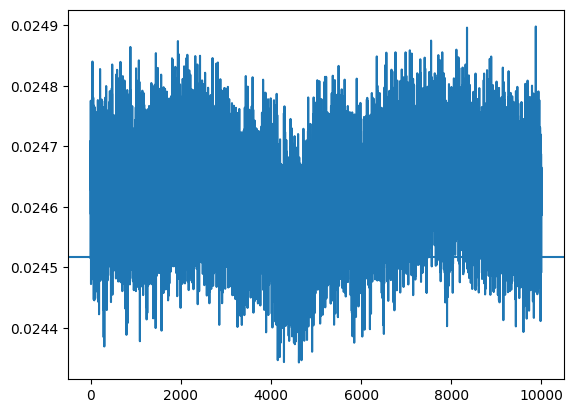

In [44]:
import matplotlib.pyplot as plt

plt.figure()
plt.plot(
dataset["I_q3_q4"].values
)

plt.axhline(0.024516836383468563)

In [ ]:
from calibration_utils.common_utils.parity_streams import (
    declare_parity_streams,
    save_parity_measurement,
    buffer_parity_streams,
    process_parity_streams,
)
from qualang_tools.units import unit
import numpy as np

u = unit(coerce_to_integer=True)

# Get the active qubits from the node and organize them by batches
qubits = [machine.qubits["q3"]]
num_qubits = len(qubits)
operation = "x90"  # The qubit operation to play

# Adjust the pulse duration and amplitude to drive the qubit into a mixed state - can be None
operation_len = 1000

# Pulse amplitude sweep (as a pre-factor of the qubit pulse amplitude) - must be within [-2; 2)
operation_amp_factor = 1.3

for qubit in qubits:
    qubit.x.update(
        amplitude_scale=operation_amp_factor,
        duration=operation_len,
    )

n_avg = 500  # The number of averages

# Qubit detuning sweep with respect to their resonance frequencies
span = 200 * u.MHz
step = 0.1 * u.MHz
dfs = np.arange(-span // 2, +span // 2, step)

# Register the sweep axes to be added to the dataset when fetching data
sweep_axes = {
    "qubit": xr.DataArray(["q1"]),
    "detuning": xr.DataArray(
        dfs, attrs={"long_name": "drive frequency", "units": "Hz"}
    ),
}

with program() as prog:
    df = declare(int)
    n = declare(int)

    stream = declare_stream()
    p2 = declare(fixed)
    n_st = declare_stream()

    i, q = declare(fixed), declare(fixed)
    i_st, q_st = declare_stream(), declare_stream()

    for qubit in qubits:
        intermediate_frequency = qubit.xy.intermediate_frequency
        with for_(n, 0, n < n_avg, n + 1):
            save(n, n_st)
            with for_(*from_array(df, dfs)):
                qubit.xy.update_frequency(intermediate_frequency + df)

                align()

                qubit.initialize()

                align()
                qubit.x90()
                align()

                (i, q, state) = qubit.measure(return_iq = True)

                qubit.voltage_sequence.apply_compensation_pulse(return_to_zero = True, go_to_zero=True)

                align()
                save(i, i_st)
                save(q, q_st)

        qubit.xy.update_frequency(intermediate_frequency)

    with stream_processing():
        n_st.save("n")
        n_dfs = len(dfs)
        for qubit in qubits:
            i_st.buffer(len(dfs)).average().save("i_st")
            q_st.buffer(len(dfs)).average().save("q_st")

qmm = machine.connect(timeout=600)
config = machine.generate_config()
with qm_session(qmm, config, timeout=600) as qm:
    job = qm.execute(prog)
    data_fetcher = XarrayDataFetcher(job, sweep_axes)
    for dataset in data_fetcher:
        progress_counter(
            data_fetcher.get("n", 0),
            n_avg,
            start_time=data_fetcher.t_start,
        )
    print(job.execution_report())

C:\Users\siqec.project\AppData\Local\Temp\ipykernel_17664\3174226314.py:48: DeprecationWarning: declare_stream is deprecated since "1.2.4" and will be removed in "2.0.0". Please use declare_output_stream() instead
  stream = declare_stream()
C:\Users\siqec.project\AppData\Local\Temp\ipykernel_17664\3174226314.py:50: DeprecationWarning: declare_stream is deprecated since "1.2.4" and will be removed in "2.0.0". Please use declare_output_stream() instead
  n_st = declare_stream()
C:\Users\siqec.project\AppData\Local\Temp\ipykernel_17664\3174226314.py:53: DeprecationWarning: declare_stream is deprecated since "1.2.4" and will be removed in "2.0.0". Please use declare_output_stream() instead
  i_st, q_st = declare_stream(), declare_stream()


2026-05-10 23:53:36,765 - qm - INFO     - Performing health check
2026-05-10 23:53:36,772 - qm - INFO     - Cluster healthcheck completed successfully.
2026-05-10 23:53:37,686 - qm - INFO     - Opened quantum machine with id: QM-d3f754d6-f0f9-4571-ba1d-76d3b2435a5b
2026-05-10 23:53:37,688 - qm - INFO     - Opening QM
2026-05-10 23:53:37,689 - qm - INFO     - Clearing queue
2026-05-10 23:53:37,703 - qm - INFO     - Adding program to queue.
2026-05-10 23:53:39,339 - qm - INFO     - Program added to queue. Job id: 3067c40a-166f-4248-ac53-4d4e47f629c9
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 199.91s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 199.96s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 200.02s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 200.07s
Progress: [###

In [37]:
machine.qubits["q3"].larmor_frequency

9771121455.0

9730571455.0


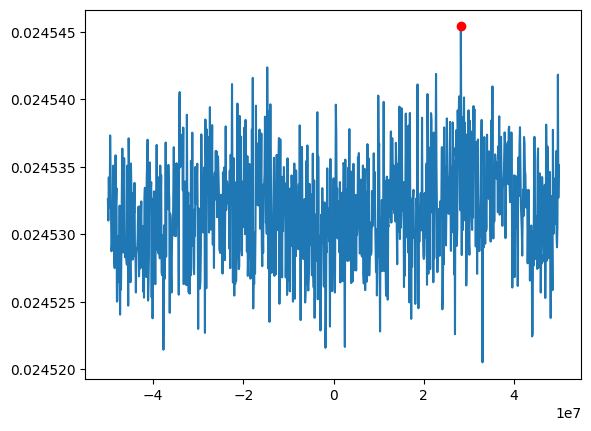

In [33]:
import matplotlib.pyplot as plt

x, y = dfs, dataset["i_st"].values

plt.figure()
plt.plot(x, 
y
)
max_idx = np.argwhere(y == max(y))[0][0]

plt.scatter(
    x[max_idx], y[max_idx], color = "r", zorder = 999
)
# plt.axhline(-0.009923797195428553)
print(x[max_idx] + machine.qubits["q3"].larmor_frequency)


In [2]:
from qm.qua import *
import xarray as xr
from qualang_tools.loops import from_array
from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualibration_libs.data import XarrayDataFetcher


def gen_program(qubit_pairs=None, barrier_array=None, detuning_array=None, hold_duration=None, ramp_duration=None, num_shots=300):
    sweep_axes = {
    "qubit_pair": xr.DataArray([qp.name for qp in qubit_pairs]),
    "barrier": xr.DataArray(
        barrier_array,
        attrs={"long_name": "ramp barrier", "units": "V"},
    ),
    "detuning": xr.DataArray(
        detuning_array,
        attrs={"long_name": "detuning", "units": "V"},
    ),
    }
       
    with program() as prog:
        n = declare(int)
        n_st = declare_output_stream()

        det = declare(fixed)
        bar = declare(fixed)

        state_int = {qp.name: declare(int) for qp in qubit_pairs}
        state_st = {qp.name: declare_output_stream() for qp in qubit_pairs}

        # i_st = {qp.name: declare_output_stream() for qp in qubit_pairs}
        # q_st = {qp.name: declare_output_stream() for qp in qubit_pairs}

        with for_(n, 0, n < num_shots, n + 1):
            save(n, n_st)

            for qubit_pair in qubit_pairs:
                dot_pair = qubit_pair.quantum_dot_pair

                with for_(*from_array(bar, barrier_array)):
                    with for_(*from_array(det, detuning_array)):

                        dot_pair.initialize(
                            ramp_duration=ramp_duration,
                            hold_duration=hold_duration,
                            point={
                                dot_pair.name: det,
                                dot_pair.barrier_gate.name: bar
                                },
                        )

                        # (i, q, state) = dot_pair.measure(return_iq=True)
                        state = dot_pair.measure()

                        assign(
                            state_int[qubit_pair.name],
                            Cast.to_int(state),
                        )

                        align()
                        dot_pair.voltage_sequence.ramp_to_zero()

                        save(state_int[qubit_pair.name], state_st[qubit_pair.name])
                        # save(i, i_st[qubit_pair.name])
                        # save(q, q_st[qubit_pair.name])

        with stream_processing():
            n_st.save("n")
            for qp in qubit_pairs:
                # inner buffer = wait (innermost loop), outer buffer = ramp
                state_st[qp.name].buffer(len(detuning_array)).buffer(
                    len(barrier_array)
                ).average().save(f"state_{qp.name}")
                # i_st[qp.name].buffer(len(detuning_array)).buffer(
                #     len(barrier_array)
                # ).average().save(f"I_{qp.name}")
                # q_st[qp.name].buffer(len(detuning_array)).buffer(
                #     len(barrier_array)
                # ).average().save(f"Q_{qp.name}")
    
    return prog, sweep_axes


In [ ]:
import numpy as np

barrier_array = np.linspace(-0.5, 2.5, 100)
detuning_array = np.linspace(0.25, 0.95, 125)
ramp_duration = 10000
hold_duration = 10000
num_shots = 500

prog, sweep_axes = gen_program(
    qubit_pairs=[machine.qubit_pairs['q1_q2']],
    barrier_array=barrier_array,
    detuning_array=detuning_array,
    hold_duration=hold_duration,
    ramp_duration=ramp_duration,
    num_shots=num_shots
)

qmm = machine.connect(timeout=600)
config = machine.generate_config()
with qm_session(qmm, config, timeout=600) as qm:
    job = qm.execute(prog)
    data_fetcher = XarrayDataFetcher(job, sweep_axes)
    for dataset in data_fetcher:
        progress_counter(
            data_fetcher.get("n", 0),
            num_shots,
            start_time=data_fetcher.t_start,
        )
    print(job.execution_report())

2026-05-08 12:30:05,372 - qm - INFO     - Performing health check
2026-05-08 12:30:05,380 - qm - INFO     - Cluster healthcheck completed successfully.
2026-05-08 12:30:06,555 - qm - INFO     - Opened quantum machine with id: QM-661f2163-f1cf-4413-b272-12997bda14dd
2026-05-08 12:30:06,556 - qm - INFO     - Opening QM
2026-05-08 12:30:06,557 - qm - INFO     - Clearing queue
2026-05-08 12:30:06,572 - qm - INFO     - Adding program to queue.
2026-05-08 12:32:07,843 - qm - INFO     - Program added to queue. Job id: b9326bd8-e840-4c2f-bea9-03fd6a0c6e15
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 632.22s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 632.27s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 632.32s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 632.36s
Progress: [###

In [3]:
import numpy as np

barrier_array = np.linspace(0.5, 1.5, 51)
detuning_array = np.linspace(0.3, 0.4, 61)
ramp_duration = 100
hold_duration = 100000
num_shots = 500

prog, sweep_axes = gen_program(
    qubit_pairs=[machine.qubit_pairs['q3_q4']],
    barrier_array=barrier_array,
    detuning_array=detuning_array,
    hold_duration=hold_duration,
    ramp_duration=ramp_duration,
    num_shots=num_shots
)

qmm = machine.connect(timeout=600)
config = machine.generate_config()
with qm_session(qmm, config, timeout=600) as qm:
    job = qm.execute(prog)
    data_fetcher = XarrayDataFetcher(job, sweep_axes)
    for dataset in data_fetcher:
        progress_counter(
            data_fetcher.get("n", 0),
            num_shots,
            start_time=data_fetcher.t_start,
        )
    print(job.execution_report())

2026-05-11 14:56:29,056 - qm - INFO     - Performing health check
2026-05-11 14:56:29,063 - qm - INFO     - Cluster healthcheck completed successfully.
2026-05-11 14:56:30,992 - qm - INFO     - Opened quantum machine with id: QM-ed42c401-b962-4890-865c-90356e097e15
2026-05-11 14:56:30,994 - qm - INFO     - Opening QM
2026-05-11 14:56:30,995 - qm - INFO     - Clearing queue
2026-05-11 14:56:31,006 - qm - INFO     - Adding program to queue.
2026-05-11 14:58:14,137 - qm - INFO     - Program added to queue. Job id: 3c449963-4e4b-4e90-b323-ff12883ebd45
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 997.20s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 997.24s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 997.29s
Progress: [##################################################] 100.0% (n=500/500) --> elapsed time: 997.33s
Progress: [###

In [10]:
machine.qubit_pairs['q3_q4'].quantum_dot_pair.barrier_gate

BarrierGate(id='virtual_barrier_3', macros={'align': AlignMacro(id='align', fidelity=None, duration=0.0), 'wait': WaitMacro(id='wait', fidelity=None, duration=16, elements=None)}, physical_channel=VoltageGate(operations={'half_max_square': SquarePulse(length=16, id=None, digital_marker=None, amplitude=0.25, axis_angle=None)}, id='barrier_3', digital_outputs={}, sticky=StickyChannelAddon(duration=16, enabled=True, analog=True, digital=False), intermediate_frequency=None, thread=None, core=None, opx_output=LFFEMAnalogOutputPort(controller_id='con1', fem_id=7, port_id=7, offset=None, delay=161, crosstalk=None, feedforward_filter=None, feedback_filter=None, shareable=False, sampling_rate=1000000000.0, upsampling_mode='pulse', exponential_filter=[(1.0, 7607773.666802497)], exponential_dc_gain=None, high_pass_filter=None, output_mode='amplified'), filter_fir_taps=None, filter_iir_taps=None, opx_output_offset=None, attenuation=0.0, settling_time=None, current_external_voltage=None, dac_spec=N

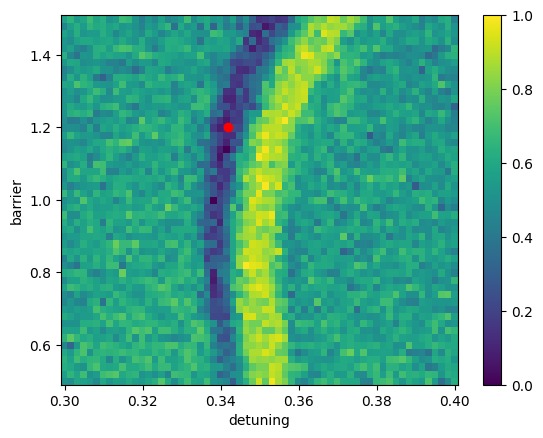

In [16]:
plt.figure()
plt.pcolor(detuning_array, barrier_array, dataset.state_q3_q4)
plt.ylabel('barrier')
plt.xlabel('detuning')
plt.scatter(0.342, 1.2, color = "r", zorder = 999)
plt.colorbar()

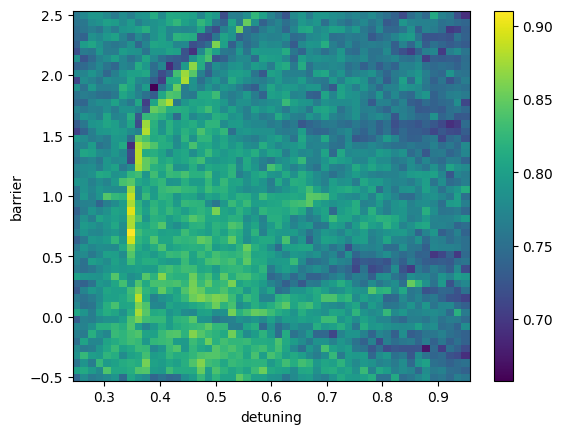

In [6]:
plt.figure()
plt.pcolor(detuning_array, barrier_array, dataset.state_q3_q4)
plt.ylabel('barrier')
plt.xlabel('detuning')
plt.colorbar()

In [5]:
dataset.state_q1_q2.shape

(100, 125)

In [5]:
import matplotlib.pyplot as plt

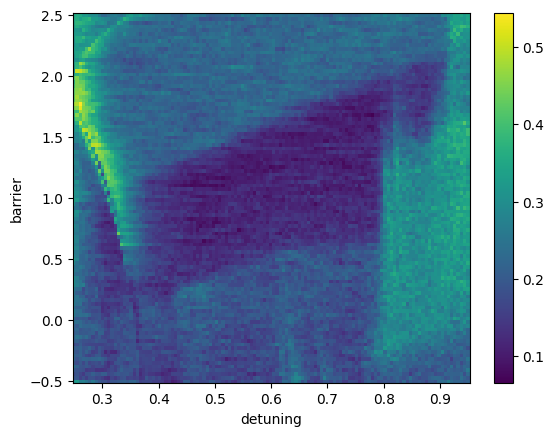

In [11]:
plt.pcolor(detuning_array, barrier_array, dataset.state_q1_q2)
plt.ylabel('barrier')
plt.xlabel('detuning')
plt.colorbar()

In [12]:
machine.quantum_dot_pairs['virtual_dot_1_virtual_dot_2_pair'].barrier_gate.name

'virtual_barrier_1'

In [60]:
from quam_config import QubitQuam as Quam
machine = Quam.load()




c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:294: UserWarning: This component is not part of any QuamRoot, using last instantiated QuamRoot. This is not recommended as it may lead to unexpected behaviour. Component: ReadoutResonatorSingle
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:294: UserWarning: This component is not part of any QuamRoot, using last instantiated QuamRoot. This is not recommended as it may lead to unexpected behaviour. Component: VirtualGateSet
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:294: UserWarning: This component is not part of any QuamRoot, using last instantiated QuamRoot. This is not recommended as it may lead to unexpected behaviour. Component: QuantumDotPair
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py

In [61]:
machine.generate_config()

{'controllers': {'con1': {'fems': {7: {'type': 'LF',
     'analog_outputs': {1: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'output_mode': 'amplified',
       'offset': 0.0},
      2: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'output_mode': 'amplified',
       'offset': 0.0},
      3: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'output_mode': 'amplified',
       'offset': 0.0},
      4: {'delay': 161,
       'shareable': False,
       'filter': {'exponential': [(1.0, 7607773.666802497)]},
       'sampling_rate': 1000000000.0,
       'upsampling_mode': 'pulse',
       'out

In [59]:
machine.quantum_dot_pairs["virtual_dot_3_virtual_dot_4_pair"].sensor_dots



['#/sensor_dots/virtual_sensor_2']

In [ ]:
amp = 0.6
machine.qubits['q1'].xy.operations.gaussian.amplitude = amp
machine.qubits['q1'].xy.operations.gaussian_pi.amplitude = amp
machine.qubits['q2'].xy.operations.gaussian.amplitude = amp
machine.qubits['q2'].xy.operations.gaussian_pi.amplitude = amp
machine.save()

In [ ]:
dur = 1500
machine.qubits['q1'].xy.operations.gaussian.length = dur
machine.qubits['q1'].xy.operations.gaussian_pi.length = dur
machine.qubits['q2'].xy.operations.gaussian.length = dur
machine.qubits['q2'].xy.operations.gaussian_pi.length = dur
machine.save()

In [16]:
machine.sensor_dots["virtual_sensor_1"].readout_resonator.operations



{'readout': SquareReadoutPulse(length=40000, id='readout', digital_marker='ON', amplitude=0.02, axis_angle=None, threshold=None, rus_exit_threshold=None, integration_weights=[(1, 40000)], integration_weights_angle=8.361253692234541), 'readout_virtual_dot_1_virtual_dot_2_pair': SquareReadoutPulse(length=40000, id='readout_virtual_dot_1_virtual_dot_2_pair', digital_marker='ON', amplitude=0.02, axis_angle=None, threshold=None, rus_exit_threshold=None, integration_weights=[(1, 40000)], integration_weights_angle=8.361253692234541), 'readout_virtual_dot_2_virtual_dot_3_pair': SquareReadoutPulse(length=40000, id='readout_virtual_dot_2_virtual_dot_3_pair', digital_marker='ON', amplitude=0.02, axis_angle=None, threshold=None, rus_exit_threshold=None, integration_weights=[(1, 40000)], integration_weights_angle=8.361253692234541)}

In [21]:
machine.qubits['q1'].larmor_frequency -= 1e6

In [6]:
import h5py
path = r"C:\Users\siqec.project\src\quantum_machines\qualibrate\user_storage\2026-05-08\#228_08b_qubit_spectroscopy_234847"
h5py.File(path + r"\ds_raw.h5")


OSError: Unable to synchronously open file (file signature not found)

In [28]:
machine.qubit_pairs['q1_q2'].add_point(point_name='exchange', voltages={'virtual_barrier_1': 0.25})

'q1_q2_exchange'

In [29]:
machine.save()

In [2]:
from qm.qua import *
import xarray as xr
from qualang_tools.loops import from_array
from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter
from qualibration_libs.data import XarrayDataFetcher


def gen_program(qubit_pairs=None, ramp_array=None, detuning_array=None, hold_duration=None, barrier=None, num_shots=300):
    sweep_axes = {
    "qubit_pair": xr.DataArray([qp.name for qp in qubit_pairs]),
    "ramp_array": xr.DataArray(
        ramp_array,
        attrs={"long_name": "ramp_time", "units": "ns"},
    ),
    "detuning": xr.DataArray(
        detuning_array,
        attrs={"long_name": "detuning", "units": "V"},
    ),
    }
       
    with program() as prog:
        n = declare(int)
        n_st = declare_output_stream()

        det = declare(fixed)
        ramp = declare(int)

        state_int = {qp.name: declare(int) for qp in qubit_pairs}
        state_st = {qp.name: declare_output_stream() for qp in qubit_pairs}

        # i_st = {qp.name: declare_output_stream() for qp in qubit_pairs}
        # q_st = {qp.name: declare_output_stream() for qp in qubit_pairs}

        with for_(n, 0, n < num_shots, n + 1):
            save(n, n_st)

            for qubit_pair in qubit_pairs:
                dot_pair = qubit_pair.quantum_dot_pair

                with for_(*from_array(ramp, ramp_array)):
                    with for_(*from_array(det, detuning_array)):

                        dot_pair.initialize(
                            ramp_duration=ramp,
                            hold_duration=hold_duration,
                            point={
                                dot_pair.name: det,
                                dot_pair.barrier_gate.name: barrier
                                },
                        )

                        # (i, q, state) = dot_pair.measure(return_iq=True)
                        state = dot_pair.measure()

                        assign(
                            state_int[qubit_pair.name],
                            Cast.to_int(state),
                        )

                        align()
                        dot_pair.voltage_sequence.ramp_to_zero()

                        save(state_int[qubit_pair.name], state_st[qubit_pair.name])
                        # save(i, i_st[qubit_pair.name])
                        # save(q, q_st[qubit_pair.name])

        with stream_processing():
            n_st.save("n")
            for qp in qubit_pairs:
                # inner buffer = wait (innermost loop), outer buffer = ramp
                state_st[qp.name].buffer(len(detuning_array)).buffer(
                    len(ramp_array)
                ).average().save(f"state_{qp.name}")
                # i_st[qp.name].buffer(len(detuning_array)).buffer(
                #     len(barrier_array)
                # ).average().save(f"I_{qp.name}")
                # q_st[qp.name].buffer(len(detuning_array)).buffer(
                #     len(barrier_array)
                # ).average().save(f"Q_{qp.name}")
    
    return prog, sweep_axes


array([    4,  1004,  2004,  3004,  4004,  5004,  6004,  7004,  8004,
        9004, 10004, 11004, 12004, 13004, 14004, 15004, 16004, 17004,
       18004, 19004, 20004, 21004, 22004, 23004, 24004, 25004, 26004,
       27004, 28004, 29004, 30004, 31004, 32004, 33004, 34004, 35004,
       36004, 37004, 38004, 39004, 40004, 41004, 42004, 43004, 44004,
       45004, 46004, 47004, 48004, 49004, 50004, 51004, 52004, 53004,
       54004, 55004, 56004, 57004, 58004, 59004, 60004, 61004, 62004,
       63004, 64004, 65004, 66004, 67004, 68004, 69004, 70004, 71004,
       72004, 73004, 74004, 75004, 76004, 77004, 78004, 79004, 80004,
       81004, 82004, 83004, 84004, 85004, 86004, 87004, 88004, 89004,
       90004, 91004, 92004, 93004, 94004, 95004, 96004, 97004, 98004,
       99004])

In [8]:
import numpy as np

ramp_array = np.arange(4, 100000, 1000)
detuning_array = np.linspace(0.3, 0.4, 41)
barrier = 1.0
hold_duration = 12000
num_shots = 200

prog, sweep_axes = gen_program(
    qubit_pairs=[machine.qubit_pairs['q1_q2']],
    barrier=barrier,
    detuning_array=detuning_array,
    hold_duration=hold_duration,
    ramp_array=ramp_array,
    num_shots=num_shots
)

qmm = machine.connect(timeout=600)
config = machine.generate_config()
with qm_session(qmm, config, timeout=600) as qm:
    job = qm.execute(prog)
    data_fetcher = XarrayDataFetcher(job, sweep_axes)
    for dataset in data_fetcher:
        progress_counter(
            data_fetcher.get("n", 0),
            num_shots,
            start_time=data_fetcher.t_start,
        )
    print(job.execution_report())

Guidance: Using QUA variable for `ramp_duration`. Ensure hold `duration` is sufficient.
Guidance: Using QUA variable for `ramp_duration`. Ensure hold `duration` is sufficient.
2026-05-12 16:48:16,646 - qm - INFO     - Performing health check
2026-05-12 16:48:16,653 - qm - INFO     - Cluster healthcheck completed successfully.
2026-05-12 16:48:18,535 - qm - INFO     - Opened quantum machine with id: QM-82423a01-8d4f-4c65-87b5-751ab4ed34fd
2026-05-12 16:48:18,538 - qm - INFO     - Opening QM
2026-05-12 16:48:18,540 - qm - INFO     - Clearing queue
2026-05-12 16:48:18,554 - qm - INFO     - Adding program to queue.
2026-05-12 16:49:45,427 - qm - INFO     - Program added to queue. Job id: f13900e7-c8b3-4789-acd9-9c308bfeaf24
Progress: [##################################################] 100.0% (n=200/200) --> elapsed time: 1255.81s
Progress: [##################################################] 100.0% (n=200/200) --> elapsed time: 1255.85s
Progress: [#########################################

In [9]:
dataset

<xarray.Dataset> Size: 34kB
Dimensions:      (qubit_pair: 1, ramp_array: 100, detuning: 41)
Coordinates:
  * qubit_pair   (qubit_pair) <U5 20B 'q1_q2'
  * ramp_array   (ramp_array) int64 800B 4 1004 2004 3004 ... 97004 98004 99004
  * detuning     (detuning) float64 328B 0.3 0.3025 0.305 ... 0.395 0.3975 0.4
Data variables:
    state_q1_q2  (ramp_array, detuning) float64 33kB 0.96 0.0 0.0 ... 1.0 1.0

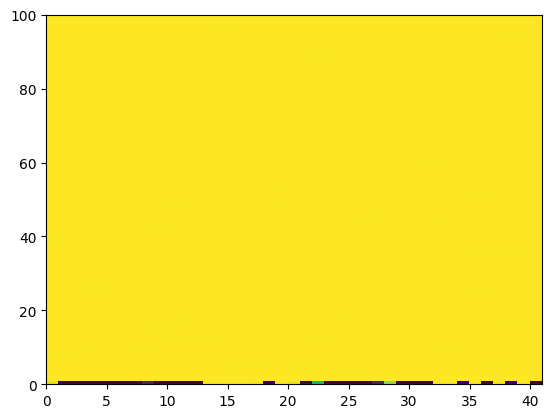

In [15]:
import matplotlib.pyplot as plt


plt.figure()
plt.pcolor( dataset.state_q1_q2
           )

In [11]:
dataset.state_q1_q2

<xarray.DataArray 'state_q1_q2' (ramp_array: 100, detuning: 41)> Size: 33kB
array([[0.96, 0.  , 0.  , ..., 0.  , 1.  , 0.  ],
       [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
       [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
       ...,
       [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
       [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ],
       [1.  , 1.  , 1.  , ..., 1.  , 1.  , 1.  ]], shape=(100, 41))
Coordinates:
  * ramp_array  (ramp_array) int64 800B 4 1004 2004 3004 ... 97004 98004 99004
  * detuning    (detuning) float64 328B 0.3 0.3025 0.305 ... 0.395 0.3975 0.4

In [21]:
f1 = machine.qubits['q1'].larmor_frequency
f2 = machine.qubits['q2'].larmor_frequency
t = 1/(f1-f2)

In [23]:
t*1e9

-200.83763956900057

In [3]:
qubit = machine.qubits['q1']
amplitude_set = qubit.x180.pi_pulse.amplitude
qubit.x180.update(pi_amplitude=amplitude_set)


In [4]:
amplitude_set

0.13061934059686178

In [24]:
# %% {Imports}
from dataclasses import asdict
from typing import List, Tuple

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from qm.qua import *

from qualang_tools.multi_user import qm_session
from qualang_tools.results import progress_counter

from qualibrate.core import QualibrationNode
from qualibrate.core.models.outcome import Outcome

from quam_config import Quam

from calibration_utils.common_utils.experiment import get_qubits
from calibration_utils.iq_blobs import fit_raw_data, log_fitted_results
from calibration_utils.iq_blobs.analysis import FitParameters
from calibration_utils.iq_blobs.plotting import plot_iq_blobs
from calibration_utils.psb_search_fixed_detuning import (
    Parameters,
    plot_labeled_histogram_barthel,
    plot_labeled_histogram_gmm,
)
from qualibration_libs.data import XarrayDataFetcher
from qualibration_libs.runtime import simulate_and_plot


# %% {Node initialisation}
description = """
        PAULI SPIN BLOCKADE SEARCH - Fixed Configuration, Labeled Two-State Readout
Acquires labeled shot-by-shot IQ data at the configured measure point for each qubit by measuring
twice per shot: once without a pi pulse (loading ``init_state_label``) and once with a pi pulse
(loading the complementary state). The two streams are used to fit either the Barthel 1D readout
model or a 2-component Gaussian mixture model.

Qubit pairs are resolved automatically from ``qubit.preferred_readout_quantum_dot``; no explicit
``qubit_pairs`` parameter is required.

Prerequisites:
    - Initialized Quam, calibrated sensor resonators, x180 pulse calibrated on each qubit.
    - Empty / initialize / measure voltages defined; optional ``detuning`` override for this run.

Node parameters:
    init_state_label : 'decay' | 'no_decay'
        Which physical state is prepared WITHOUT the pi pulse.
        'decay'    → no pi  = T (triplet, decays during measurement); pi = S (singlet)
        'no_decay' → no pi  = S (singlet);                            pi = T (triplet)
    analysis_model : 'barthel' | 'gmm'
        'barthel' – physics-based Barthel 1D model (MCMC, recommended).
        'gmm'     – 2-component Gaussian mixture model via PCA + sklearn.

State update:
    Reverts any temporary detuning override, then (if the fit succeeded) updates the
    integration-weights angle and discrimination threshold on the sensor dot.
"""


node = QualibrationNode[Parameters, Quam](
    name="06d_PSB_search_opx_fixed_detuning",
    description=description,
    parameters=Parameters(),
)


@node.run_action(skip_if=node.modes.external)
def custom_param(node: QualibrationNode[Parameters, Quam]):
    node.parameters.qubits = ["q1", "q2"]
    node.parameters.simulate = False
    node.parameters.simulation_duration_ns = 60_000
    node.parameters.num_shots = 1000
    node.parameters.init_state_label = "decay"
    node.parameters.analysis_model = "barthel"


node.machine = Quam.load()


# %% {Helpers}
def _resolve_qubits_and_dot_pairs(node: QualibrationNode[Parameters, Quam]):
    """Return list of (qubit, dot_pair) tuples resolved from qubit.preferred_readout_quantum_dot."""
    machine = node.machine
    qubits = get_qubits(node)
    pairs = []
    for qubit in qubits:
        preferred_dot_id = getattr(qubit, "preferred_readout_quantum_dot", None)
        if preferred_dot_id is None:
            raise ValueError(
                f"Qubit {qubit.id!r} has no preferred_readout_quantum_dot set; "
                "configure it to the partner dot used for PSB readout."
            )
        pair_name = machine.find_quantum_dot_pair(qubit.quantum_dot.id, preferred_dot_id)
        if pair_name is None:
            raise ValueError(
                f"No QuantumDotPair registered for dots {qubit.quantum_dot.id!r} and "
                f"{preferred_dot_id!r} (qubit {qubit.id!r})."
            )
        pairs.append((qubit, machine.quantum_dot_pairs[pair_name]))
    return qubits, pairs


def _build_labeled_dataset(ds_raw: xr.Dataset, init_state_label: str) -> xr.Dataset:
    """Map I_no_pi/Q_no_pi/I_pi/Q_pi → Ig/Qg/Ie/Qe based on init_state_label."""
    if init_state_label == "decay":
        # No pi pulse loads T (decay/excited); pi pulse loads S (ground)
        return xr.Dataset({
            "Ig": ds_raw["I_pi"],
            "Qg": ds_raw["Q_pi"],
            "Ie": ds_raw["I_no_pi"],
            "Qe": ds_raw["Q_no_pi"],
        })
    else:  # "no_decay"
        # No pi pulse loads S (ground); pi pulse loads T (excited)
        return xr.Dataset({
            "Ig": ds_raw["I_no_pi"],
            "Qg": ds_raw["Q_no_pi"],
            "Ie": ds_raw["I_pi"],
            "Qe": ds_raw["Q_pi"],
        })


def _gmm_analytic_fidelity(means, stds, weights, t_grid=None):
    """Compute optimal analytic fidelity F = 0.5*(FS + FT) for a 2-component GMM.

    Uses the same convention as Barthel1DMetricCurves (utils.py:334):
        FS = P(X <= t | component 0, the S/ground component)
        FT = P(X  > t | component 1, the T/excited component)
        F  = 0.5 * (FS + FT)
    Sweeps t over a dense grid and returns the maximum.
    """
    from scipy.stats import norm as _norm

    m0, m1 = float(means[0]), float(means[1])  # S component < T component
    s0, s1 = float(stds[0]),  float(stds[1])

    if t_grid is None:
        lo = min(m0 - 4 * s0, m1 - 4 * s1)
        hi = max(m0 + 4 * s0, m1 + 4 * s1)
        t_grid = np.linspace(lo, hi, 2000)

    FS = _norm.cdf(t_grid, loc=m0, scale=s0)          # P(X <= t | S)
    FT = 1.0 - _norm.cdf(t_grid, loc=m1, scale=s1)    # P(X > t  | T)
    fidelity_curve = 0.5 * (FS + FT)

    best_idx = int(np.argmax(fidelity_curve))
    return float(fidelity_curve[best_idx]), float(t_grid[best_idx])


def _fit_gmm_labeled(ds_labeled: xr.Dataset, qubits):
    """2-component sklearn GMM on PCA-projected labeled IQ data.

    Returns ``(fit_results, ds_gmm_fit)`` where ``ds_gmm_fit`` contains the per-qubit
    PCA projections and GMM component parameters needed by ``plot_labeled_histogram_gmm``.

    Fidelity is the analytic model optimum 0.5*(FS+FT) — same convention as
    Barthel1DMetricCurves — NOT a confusion-matrix count.
    """
    import jax.numpy as jnp
    from sklearn.mixture import GaussianMixture
    from calibration_utils.iq_blobs.readout_barthel.pca import pca_project_1d

    fit_results = {}
    qnames = [q.name for q in qubits]

    y_g_list, y_e_list = [], []
    gmm_mean_S_list, gmm_mean_T_list = [], []
    gmm_std_S_list,  gmm_std_T_list  = [], []
    gmm_weight_S_list, gmm_weight_T_list = [], []
    ge_threshold_list, readout_fidelity_list = [], []

    for q in qubits:
        qname = q.name
        Ig = np.asarray(ds_labeled["Ig"].sel(qubit=qname).values, dtype=float).ravel()
        Qg = np.asarray(ds_labeled["Qg"].sel(qubit=qname).values, dtype=float).ravel()
        Ie = np.asarray(ds_labeled["Ie"].sel(qubit=qname).values, dtype=float).ravel()
        Qe = np.asarray(ds_labeled["Qe"].sel(qubit=qname).values, dtype=float).ravel()

        mask = np.isfinite(Ig) & np.isfinite(Qg) & np.isfinite(Ie) & np.isfinite(Qe)
        Ig, Qg, Ie, Qe = Ig[mask], Qg[mask], Ie[mask], Qe[mask]

        X_g = np.column_stack([Ig, Qg])
        X_e = np.column_stack([Ie, Qe])
        n_g = len(X_g)
        X_all = np.vstack([X_g, X_e])
        labels_arr = np.concatenate([np.zeros(n_g), np.ones(len(X_e))])

        y, proj = pca_project_1d(jnp.asarray(X_all), labels=jnp.asarray(labels_arr))
        y = np.asarray(y, dtype=float)

        gmm = GaussianMixture(n_components=2, random_state=42)
        gmm.fit(y.reshape(-1, 1))

        sorted_idx = np.argsort(gmm.means_.ravel())
        means_sorted   = gmm.means_.ravel()[sorted_idx]
        stds_sorted    = np.sqrt(gmm.covariances_.ravel()[sorted_idx])
        weights_sorted = gmm.weights_[sorted_idx]

        # Analytic optimal fidelity from the fitted model (not a confusion-matrix count)
        readout_fidelity, threshold = _gmm_analytic_fidelity(means_sorted, stds_sorted, weights_sorted)
        readout_fidelity *= 100.0

        proj_dir = np.asarray(proj.pc1) * float(proj.sign)
        iw_angle = float(np.arctan2(proj_dir[1], proj_dir[0]))
        threshold_point = np.asarray(proj.mean) + threshold * proj_dir
        I_threshold = float(threshold_point[0])

        y_g = y[:n_g]
        y_e = y[n_g:]
        gg = float(np.mean(y_g <= threshold))
        ge = float(np.mean(y_g > threshold))
        eg = float(np.mean(y_e <= threshold))
        ee = float(np.mean(y_e > threshold))

        fit_results[qname] = FitParameters(
            iw_angle=iw_angle,
            ge_threshold=threshold,
            I_threshold=I_threshold,
            readout_fidelity=readout_fidelity,
            confusion_matrix=[[gg, ge], [eg, ee]],
            success=not (np.isnan(threshold) or np.isnan(readout_fidelity)),
        )

        y_g_list.append(y_g)
        y_e_list.append(y_e)
        gmm_mean_S_list.append(float(means_sorted[0]))
        gmm_mean_T_list.append(float(means_sorted[1]))
        gmm_std_S_list.append(float(stds_sorted[0]))
        gmm_std_T_list.append(float(stds_sorted[1]))
        gmm_weight_S_list.append(float(weights_sorted[0]))
        gmm_weight_T_list.append(float(weights_sorted[1]))
        ge_threshold_list.append(threshold)
        readout_fidelity_list.append(readout_fidelity / 100.0)

    # Pad y_g / y_e to a common length for storage in xr.Dataset
    n_s_max = max(len(a) for a in y_g_list)
    n_t_max = max(len(a) for a in y_e_list)
    y_g_pad = np.full((len(qnames), n_s_max), np.nan)
    y_e_pad = np.full((len(qnames), n_t_max), np.nan)
    for i, (yg, ye) in enumerate(zip(y_g_list, y_e_list)):
        y_g_pad[i, :len(yg)] = yg
        y_e_pad[i, :len(ye)] = ye

    ds_gmm_fit = xr.Dataset(
        coords={"qubit": qnames},
        data_vars={
            "y_g":           (["qubit", "n_s"],  y_g_pad),
            "y_e":           (["qubit", "n_t"],  y_e_pad),
            "gmm_mean_S":    ("qubit", np.array(gmm_mean_S_list)),
            "gmm_mean_T":    ("qubit", np.array(gmm_mean_T_list)),
            "gmm_std_S":     ("qubit", np.array(gmm_std_S_list)),
            "gmm_std_T":     ("qubit", np.array(gmm_std_T_list)),
            "gmm_weight_S":  ("qubit", np.array(gmm_weight_S_list)),
            "gmm_weight_T":  ("qubit", np.array(gmm_weight_T_list)),
            "ge_threshold":  ("qubit", np.array(ge_threshold_list)),
            "readout_fidelity": ("qubit", np.array(readout_fidelity_list)),
        },
    )

    return fit_results, ds_gmm_fit


# %% {Create_QUA_program}
@node.run_action(skip_if=node.parameters.load_data_id is not None)
def create_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Fixed-point PSB IQ acquisition with two labeled arms (no-pi and pi-pulse)."""
    qubits, qubit_dot_pairs = _resolve_qubits_and_dot_pairs(node)

    dot_pairs = [dp for _, dp in qubit_dot_pairs]
    for gate_set_id in {dp.voltage_sequence.gate_set.id for dp in dot_pairs}:
        node.machine.reset_voltage_sequence(gate_set_id)
    for dp in dot_pairs:
        if len(dp.sensor_dots) != 1:
            raise ValueError(
                f"06d expects exactly one sensor dot per pair; {dp.id!r} has {len(dp.sensor_dots)}."
            )

    node.namespace["qubits"] = qubits
    node.namespace["qubit_dot_pairs"] = qubit_dot_pairs

    node.namespace["tracked_original_detunings"] = {}
    for dp in dot_pairs:
        if node.parameters.detuning is not None:
            gate_set = dp.voltage_sequence.gate_set
            point_name = dp._create_point_name("measure")
            point = gate_set.get_macros()[point_name]
            node.namespace["tracked_original_detunings"][dp.name] = point.voltages.get(dp.name)
            point.voltages[dp.name] = node.parameters.detuning

    node.namespace["sweep_axes"] = {
        "n_runs": xr.DataArray(
            np.arange(node.parameters.num_shots), attrs={"long_name": "shot"}
        ),
    }

    with program() as node.namespace["qua_program"]:
        n = declare(int)
        n_st = declare_output_stream()

        I_no_pi_st = {q.name: declare_output_stream() for q in qubits}
        Q_no_pi_st = {q.name: declare_output_stream() for q in qubits}
        I_pi_st    = {q.name: declare_output_stream() for q in qubits}
        Q_pi_st    = {q.name: declare_output_stream() for q in qubits}

        with for_(n, 0, n < node.parameters.num_shots, n + 1):
            save(n, n_st)

            for qubit, dot_pair in qubit_dot_pairs:
                # --- Arm 1: no pi pulse ---
                dot_pair.initialize()
                align()
                (i_no_pi, q_no_pi, _) = dot_pair.measure(return_iq=True)
                save(i_no_pi, I_no_pi_st[qubit.name])
                save(q_no_pi, Q_no_pi_st[qubit.name])
                align()
                dot_pair.voltage_sequence.ramp_to_zero()

                # --- Arm 2: pi pulse ---
                dot_pair.initialize()
                align()
                qubit.x180()
                align()
                (i_pi, q_pi, _) = dot_pair.measure(return_iq=True)
                save(i_pi, I_pi_st[qubit.name])
                save(q_pi, Q_pi_st[qubit.name])
                align()
                dot_pair.voltage_sequence.ramp_to_zero()

        with stream_processing():
            n_st.save("n")
            for q in qubits:
                I_no_pi_st[q.name].buffer(node.parameters.num_shots).save(f"I_no_pi_{q.name}")
                Q_no_pi_st[q.name].buffer(node.parameters.num_shots).save(f"Q_no_pi_{q.name}")
                I_pi_st[q.name].buffer(node.parameters.num_shots).save(f"I_pi_{q.name}")
                Q_pi_st[q.name].buffer(node.parameters.num_shots).save(f"Q_pi_{q.name}")


# %% {Simulate}
@node.run_action(
    skip_if=node.parameters.load_data_id is not None or not node.parameters.simulate
)
def simulate_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Connect to the QOP and simulate the QUA program."""
    qmm = node.machine.connect()
    config = node.machine.generate_config()
    samples, fig, wf_report = simulate_and_plot(
        qmm, config, node.namespace["qua_program"], node.parameters
    )
    node.results["simulation"] = {"figure": fig, "wf_report": wf_report, "samples": samples}


# %% {Execute}
@node.run_action(
    skip_if=node.parameters.load_data_id is not None or node.parameters.simulate
)
def execute_qua_program(node: QualibrationNode[Parameters, Quam]):
    """Execute QUA and assemble ``ds_raw`` with ``I_no_pi``, ``Q_no_pi``, ``I_pi``, ``Q_pi``."""
    qmm = node.machine.connect()
    config = node.machine.generate_config()
    qubits = node.namespace["qubits"]
    qnames = [q.name for q in qubits]

    with qm_session(qmm, config, timeout=node.parameters.timeout) as qm:
        node.namespace["job"] = job = qm.execute(node.namespace["qua_program"])
        data_fetcher = XarrayDataFetcher(job, node.namespace["sweep_axes"])
        for dataset in data_fetcher:
            progress_counter(
                data_fetcher.get("n", 0),
                node.parameters.num_shots,
                start_time=data_fetcher.t_start,
            )
        node.log(job.execution_report())

    def _concat(prefix):
        arrays = [dataset[f"{prefix}_{n}"] for n in qnames]
        return xr.concat(arrays, dim="qubit").assign_coords(qubit=qnames)

    node.results["ds_raw"] = xr.Dataset({
        "I_no_pi": _concat("I_no_pi"),
        "Q_no_pi": _concat("Q_no_pi"),
        "I_pi":    _concat("I_pi"),
        "Q_pi":    _concat("Q_pi"),
    })


# %% {Load_historical_data}
@node.run_action(skip_if=node.parameters.load_data_id is None)
def load_data(node: QualibrationNode[Parameters, Quam]):
    """Load a previously acquired dataset."""
    load_data_id = node.parameters.load_data_id
    node.load_from_id(load_data_id)
    node.parameters.load_data_id = load_data_id
    qubits, qubit_dot_pairs = _resolve_qubits_and_dot_pairs(node)
    node.namespace["qubits"] = qubits
    node.namespace["qubit_dot_pairs"] = qubit_dot_pairs


# %% {Analyse_data}
@node.run_action(skip_if=node.parameters.simulate)
def analyse_data(node: QualibrationNode[Parameters, Quam]):
    """Fit labeled IQ shots with the selected model (Barthel or GMM)."""
    qubits = node.namespace["qubits"]
    ds_labeled = _build_labeled_dataset(node.results["ds_raw"], node.parameters.init_state_label)

    if node.parameters.analysis_model == "barthel":
        ds_fit, fit_results = fit_raw_data(ds_labeled, node)
        node.results["ds_fit"] = ds_fit
        # fit_raw_data reports confusion-matrix fidelity; replace with the analytic
        # model optimum stored in ds_fit.fidelity_opt (same as fit_barthel_mixed_iq).
        for q in qubits:
            fit_results[q.name].readout_fidelity = 100.0 * float(
                ds_fit["fidelity_opt"].sel(qubit=q.name)
            )
    else:  # "gmm"
        fit_results, ds_gmm_fit = _fit_gmm_labeled(ds_labeled, qubits)
        node.results["ds_gmm_fit"] = ds_gmm_fit

    node.results["fit_results"] = {k: asdict(v) for k, v in fit_results.items()}
    log_fitted_results(node.results["fit_results"], log_callable=node.log)
    node.outcomes = {
        qname: (Outcome.SUCCESSFUL if fr["success"] else Outcome.FAILED)
        for qname, fr in node.results["fit_results"].items()
    }


# %% {Plot_data}
@node.run_action(skip_if=node.parameters.simulate)
def plot_data(node: QualibrationNode[Parameters, Quam]):
    """Labeled IQ blob scatter + model histogram with fitted density + threshold."""
    qubits = node.namespace["qubits"]
    ds_labeled = _build_labeled_dataset(node.results["ds_raw"], node.parameters.init_state_label)
    figures = {}

    if node.parameters.analysis_model == "barthel" and "ds_fit" in node.results:
        fig_iq   = plot_iq_blobs(ds_labeled, list(qubits), node.results["ds_fit"])
        fig_hist = plot_labeled_histogram_barthel(ds_labeled, node.results["ds_fit"], list(qubits))
        figures["iq_blobs"]  = fig_iq
        figures["histogram"] = fig_hist
    else:  # gmm
        # IQ blob scatter — data rotated to align PC1 with I axis
        n_qubits = len(list(qubits))
        n_cols = max(1, int(np.ceil(np.sqrt(n_qubits))))
        n_rows = int(np.ceil(n_qubits / n_cols))
        fig_iq, axes = plt.subplots(n_rows, n_cols, squeeze=False)
        axes_flat = axes.ravel()
        fit_results = node.results.get("fit_results", {})
        for idx, q in enumerate(qubits):
            ax = axes_flat[idx]
            Ig = ds_labeled["Ig"].sel(qubit=q.name).values
            Qg = ds_labeled["Qg"].sel(qubit=q.name).values
            Ie = ds_labeled["Ie"].sel(qubit=q.name).values
            Qe = ds_labeled["Qe"].sel(qubit=q.name).values
            fr = fit_results.get(q.name, {})
            iw_angle = fr.get("iw_angle", 0.0)
            ge_threshold = fr.get("ge_threshold")

            # Rotate data so that the PC1 direction aligns with the I axis.
            # PCA projection: y = (X - mean) @ pc1*sign, so rotation by iw_angle
            # maps pc1 -> (1, 0) and the threshold becomes a vertical line at ge_threshold.
            mean_I = float(np.mean(np.concatenate([Ig, Ie])))
            mean_Q = float(np.mean(np.concatenate([Qg, Qe])))
            ca, sa = np.cos(iw_angle), np.sin(iw_angle)

            def _rot(I_arr, Q_arr):
                dI = I_arr - mean_I
                dQ = Q_arr - mean_Q
                return ca * dI + sa * dQ, -sa * dI + ca * dQ

            Ig_r, Qg_r = _rot(Ig, Qg)
            Ie_r, Qe_r = _rot(Ie, Qe)

            ax.plot(Ig_r * 1e3, Qg_r * 1e3, ".", alpha=0.4, markersize=2, label="Singlet (S)", color="C0")
            ax.plot(Ie_r * 1e3, Qe_r * 1e3, ".", alpha=0.4, markersize=2, label="Triplet (T)", color="C1")
            if ge_threshold is not None:
                ax.axvline(ge_threshold * 1e3, color="C3", linestyle="--", lw=1.5, label="Threshold")
            ax.set_xlabel("Rotated I [mV]")
            ax.set_ylabel("Rotated Q [mV]")
            ax.set_title(q.name)
            ax.legend(fontsize=7)
        for idx in range(n_qubits, len(axes_flat)):
            axes_flat[idx].set_visible(False)
        fig_iq.suptitle("PSB IQ blobs — GMM (rotated to PC1 axis)")
        fig_iq.tight_layout()
        figures["iq_blobs"] = fig_iq

        # GMM histogram with fitted Gaussian components
        if "ds_gmm_fit" in node.results:
            fig_hist = plot_labeled_histogram_gmm(node.results["ds_gmm_fit"], list(qubits))
            figures["histogram"] = fig_hist

    plt.show()
    node.results["figures"] = figures


# %% {Update_state}
@node.run_action(skip_if=node.parameters.simulate)
def update_state(node: QualibrationNode[Parameters, Quam]):
    """Revert detuning override; persist readout angle and threshold on the sensor dot."""
    for _, dot_pair in node.namespace["qubit_dot_pairs"]:
        if dot_pair.name in node.namespace.get("tracked_original_detunings", {}):
            gate_set = dot_pair.voltage_sequence.gate_set
            point_name = dot_pair._create_point_name("measure")
            point = gate_set.get_macros()[point_name]
            point.voltages[dot_pair.name] = node.namespace["tracked_original_detunings"][dot_pair.name]

    with node.record_state_updates():
        for qubit, dot_pair in node.namespace["qubit_dot_pairs"]:
            fit_result = node.results["fit_results"].get(qubit.name)
            if fit_result is None or not fit_result["success"]:
                continue

            sensor_dot = dot_pair.sensor_dots[0]
            op_name = "readout" + f"_{dot_pair.name}"
            operation = sensor_dot.readout_resonator.operations[op_name]
            operation.integration_weights_angle -= float(fit_result["iw_angle"])

            pair_ids = {getattr(dot_pair, "id", None), getattr(dot_pair, "name", None)} - {None, ""}
            for pair_id in pair_ids:
                sensor_dot._add_readout_params(pair_id, threshold=float(fit_result["I_threshold"]))


# %% {Save_results}
@node.run_action()
def save_results(node: QualibrationNode[Parameters, Quam]):
    node.save()


c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\qm\results\__init__.py:15: DeprecationWarning: qm.results is deprecated since "1.2.3" and will be removed in "2.0.0". If you need anything from this module, import it directly from `qm` or from `qm.simulate` for simulator-related functionality.
  warnings.warn(
2026-05-13 16:13:03,920 - qualibrate - INFO - Creating node 06d_PSB_search_opx_fixed_detuning


Running action custom_param
Action custom_param finished


c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:294: UserWarning: This component is not part of any QuamRoot, using last instantiated QuamRoot. This is not recommended as it may lead to unexpected behaviour. Component: ReadoutResonatorSingle
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:294: UserWarning: This component is not part of any QuamRoot, using last instantiated QuamRoot. This is not recommended as it may lead to unexpected behaviour. Component: VirtualGateSet
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py:294: UserWarning: This component is not part of any QuamRoot, using last instantiated QuamRoot. This is not recommended as it may lead to unexpected behaviour. Component: QuantumDotPair
  warnings.warn(
c:\Users\siqec.project\.conda\envs\quantum_machines\Lib\site-packages\quam\core\quam_classes.py

Running action create_qua_program
Action create_qua_program finished
Running action execute_qua_program
2026-05-13 16:13:07,951 - qm - INFO     - Performing health check
2026-05-13 16:13:07,958 - qm - INFO     - Cluster healthcheck completed successfully.
2026-05-13 16:13:09,136 - qm - INFO     - Opened quantum machine with id: QM-16ca3e0e-dbcf-4fc2-94ab-d995efe040c5
2026-05-13 16:13:09,141 - qm - INFO     - Opening QM
2026-05-13 16:13:09,143 - qm - INFO     - Clearing queue
2026-05-13 16:13:09,172 - qm - INFO     - Adding program to queue.
2026-05-13 16:14:22,730 - qm - INFO     - Closing QM


NameError: cannot access free variable 'dataset' where it is not associated with a value in enclosing scope

In [28]:
machine.qubits['q1'].larmor_frequency =int( machine.qubits['q2'].larmor_frequency - 6e6)

In [29]:
machine.save()